In [48]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter
import re

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

from sklearn.utils import shuffle

In [20]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /home/jds98/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [21]:
data = pd.read_csv('../data/cleaned/dataset.csv')

In [22]:
data.head()

,stars,review_body,review_title,language,product_category
0,4,"Works good, had to cut the bottom ring because...",Its nice,en,home_improvement
1,2,As amazing as these charge very quickly. I hav...,As amazing as these charge very quickly,en,wireless
2,5,Parfait pour remplir une piñata et les sachets...,Très bon rapport qualité prix,fr,toy
3,4,Article conforme à la description parfait pour...,Top,fr,apparel
4,4,Used for decor in my wedding & really loved th...,Used for decor in my wedding & really loved th...,en,lawn_and_garden


### Target

In [23]:
data['stars'].value_counts()

stars
4    4000
2    4000
5    4000
3    4000
1    4000
Name: count, dtype: int64

### Basic visualizations

In [24]:
fr = data[data['language'] == 'fr']
en = data[data['language'] == 'en']

fr1 = fr[fr['stars'] == 1]
fr2 = fr[fr['stars'] == 2]
fr3 = fr[fr['stars'] == 3]
fr4 = fr[fr['stars'] == 4]
fr5 = fr[fr['stars'] == 5]

en1 = en[en['stars'] == 1]
en2 = en[en['stars'] == 2]
en3 = en[en['stars'] == 3]
en4 = en[en['stars'] == 4]
en5 = en[en['stars'] == 5]

In [25]:
def basics_preproc(df, col):
    doc = ""
    for i, rows in df.iterrows():
        doc += rows[col]

    pattern = r"\!.?,"
    doc = re.sub(pattern, ' ', doc)
    
    bagdoc = doc.split(' ')
    bagdoc = Counter(bagdoc)
    bagdoc = dict(sorted(bagdoc.items(), key=lambda item: item[1], reverse=True))

    return doc, bagdoc

In [26]:
# Review body stars=
docfrs = []
bagdocfrs = []
frs = [fr1, fr2, fr3, fr4, fr5]
for i in range(1, 6):
    doc, bagdoc = basics_preproc(frs[i-1], 'review_body')
    docfrs.append(doc)
    bagdocfrs.append(bagdoc)

docens = []
bagdocens = []
ens = [en1, en2, en3, en4, en5]
for i in range(1, 6):
    doc, bagdoc = basics_preproc(ens[i-1], 'review_body')
    docens.append(doc)
    bagdocens.append(bagdoc)

## Visualization

### French scores

In [27]:
# for i in range(1,6):
#     plt.figure(figsize=(15,10))
#     plt.bar(list(bagdocfrs[i-1].keys())[0:30], list(bagdocfrs[i-1].values())[0:30])
#     plt.title(f'Most frequent words for french descriptions with note == {i}')

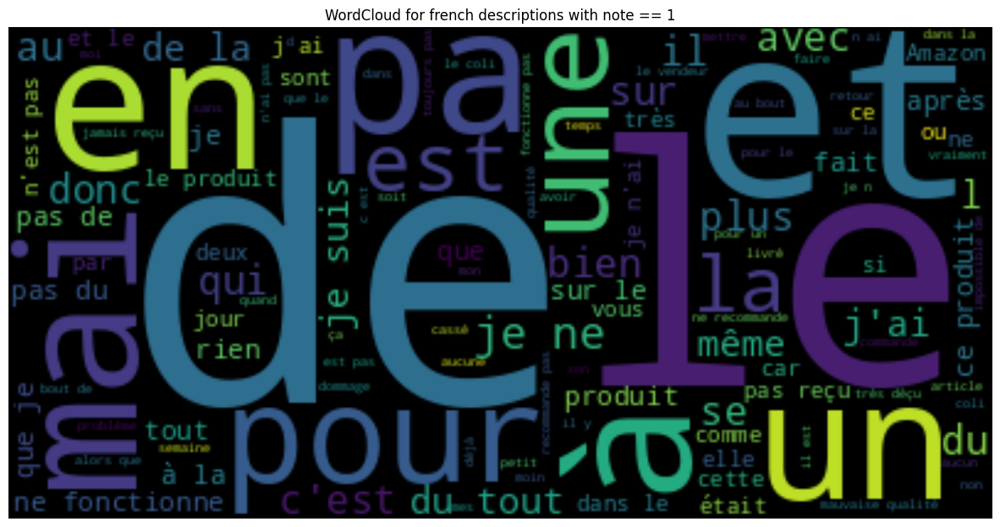

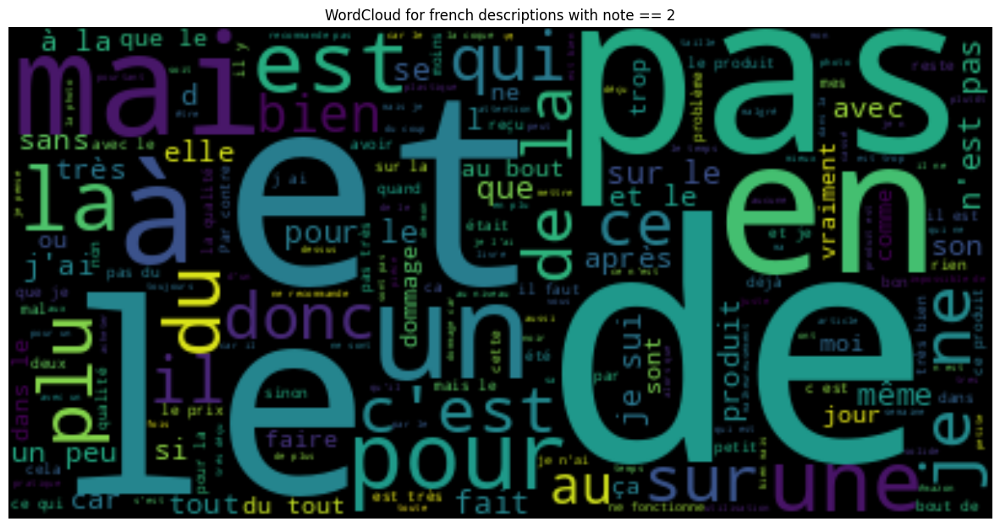

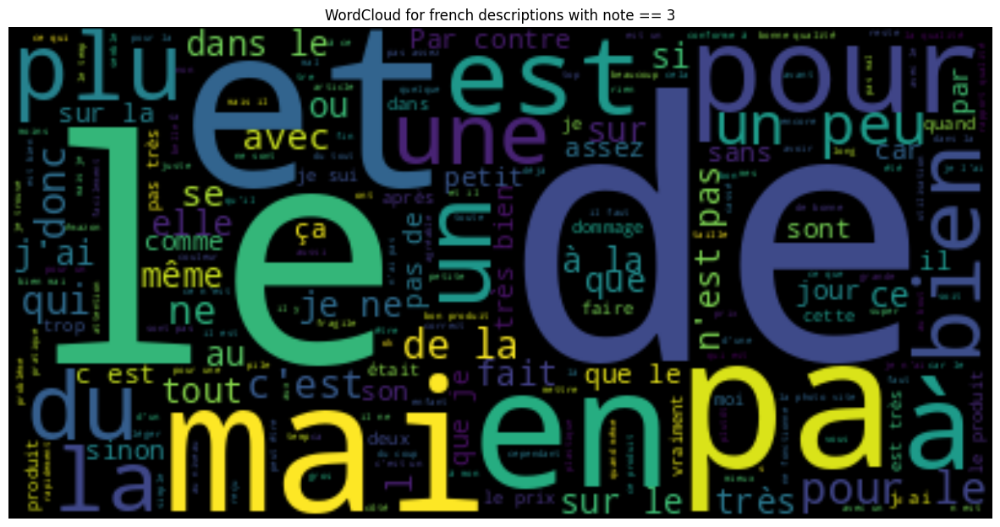

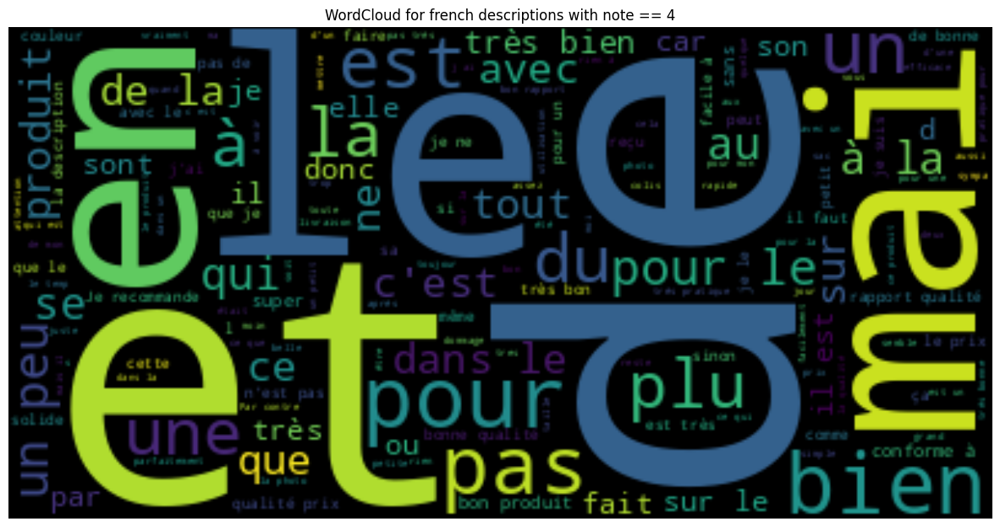

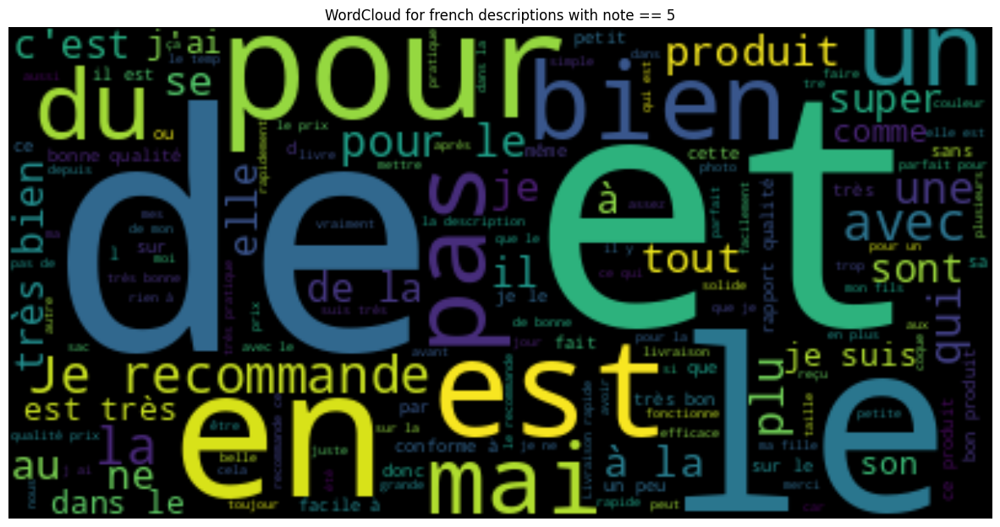

In [28]:
for i in range(1,6):
    cloudfr = WordCloud().generate(docfrs[i-1])
    plt.figure(figsize=(15,10))
    plt.imshow(cloudfr, interpolation='bilinear')
    plt.axis("off")
    plt.title(f'WordCloud for french descriptions with note == {i}')
    plt.show()

### REMOVE STOPWORDS

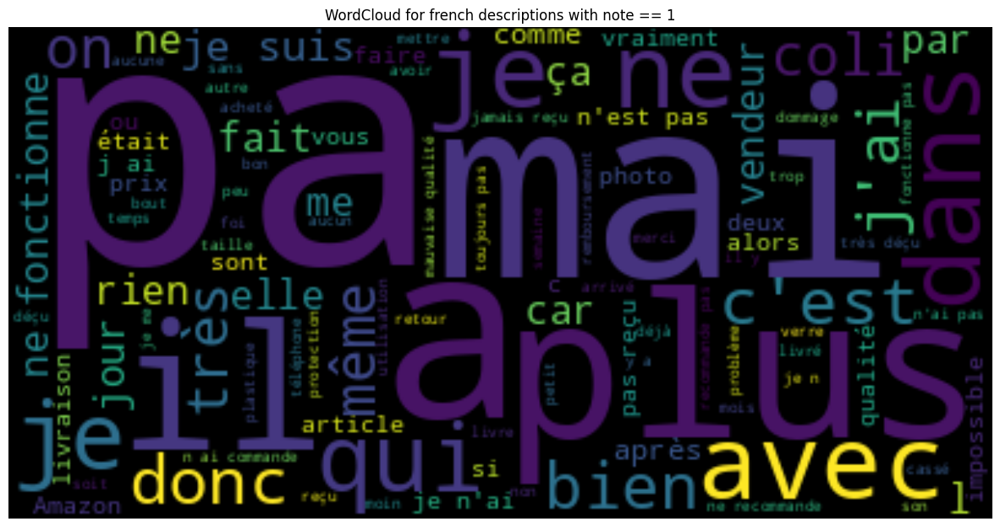

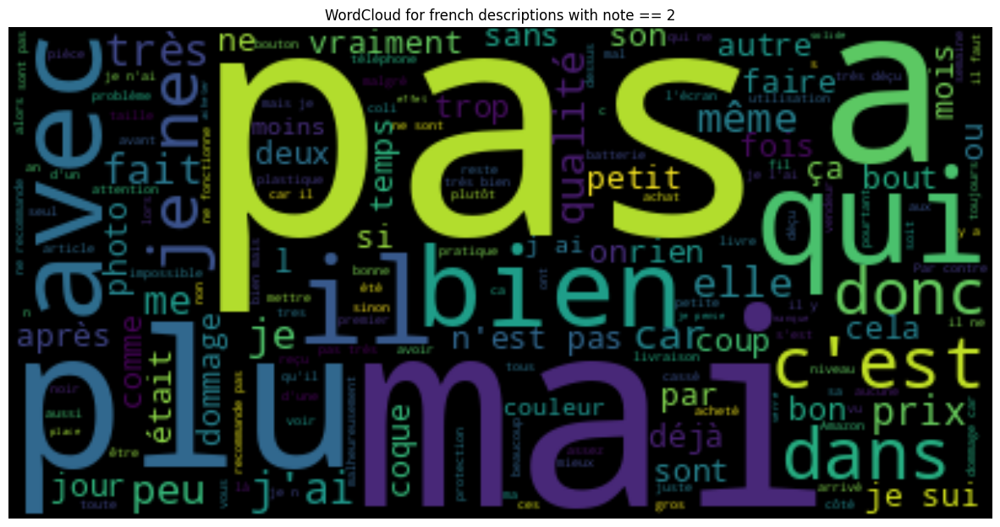

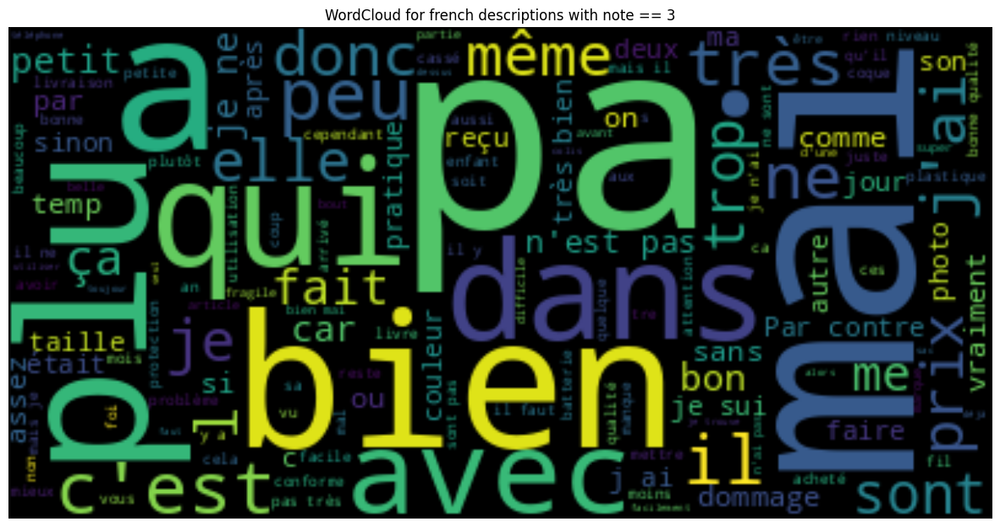

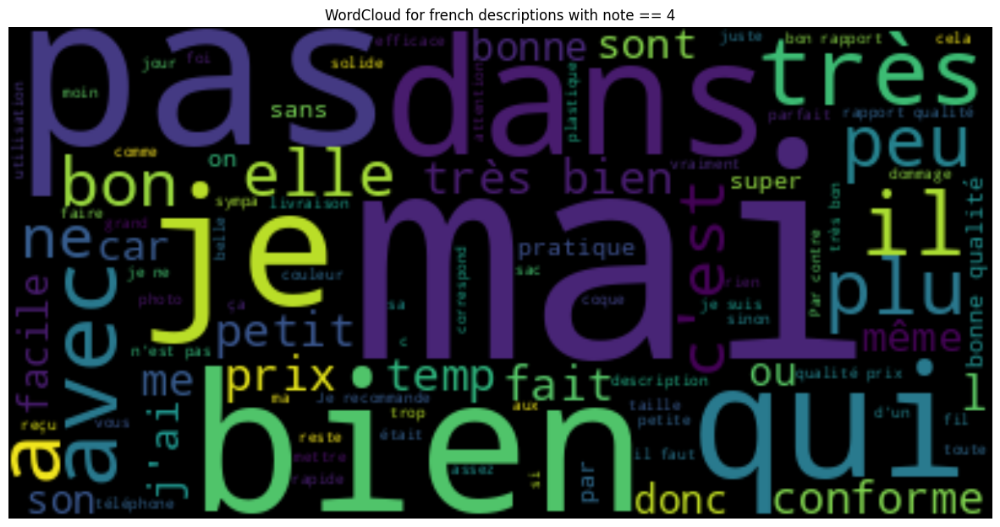

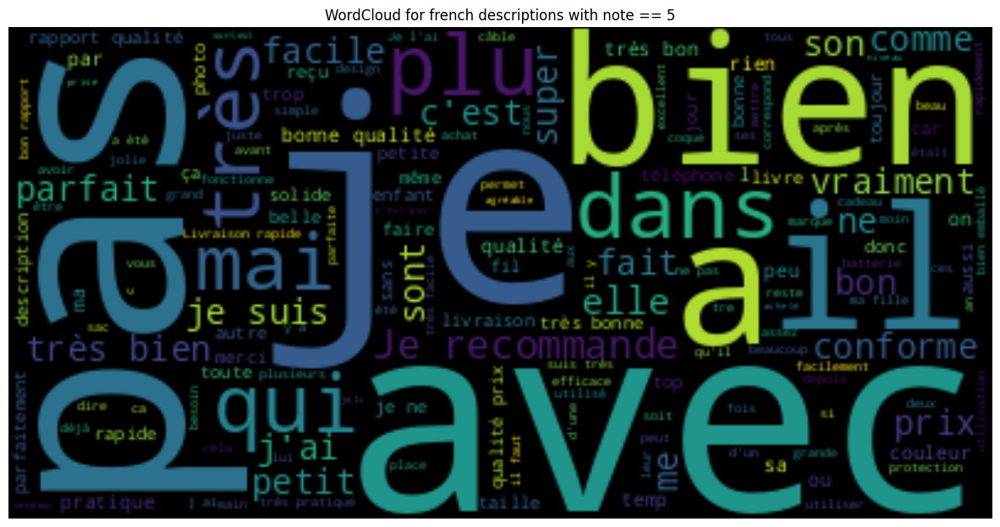

In [29]:
# Remove stopwords
# stop_words = set(stopwords.words('french'))
stop_words = ["le", "de", "produit", "pour", "et", "la", "les", "sur", "à", "en", "une", "un", "est", "quand", "ce", "cette", "d", "que", "se", "au", "des", "moi", "mon", "du","tout"]
for i in range(1,6):
    cloudfr = WordCloud(stopwords=stop_words).generate(docfrs[i-1])
    plt.figure(figsize=(15,10))
    plt.imshow(cloudfr, interpolation='bilinear')
    plt.axis("off")
    plt.title(f'WordCloud for french descriptions with note == {i}')
    plt.show()

## English Documents

In [18]:
# for i in range(1,6):
#     plt.figure(figsize=(15,10))
#     plt.bar(list(bagdocens[i-1].keys())[0:30], list(bagdocens[i-1].values())[0:30])
#     plt.title(f'Most frequent words for english descriptions with note == {i}')

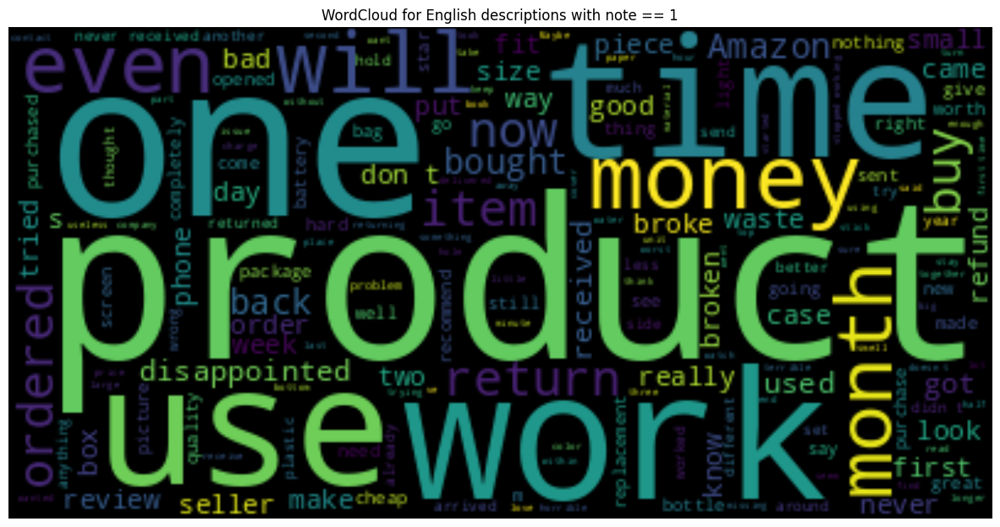

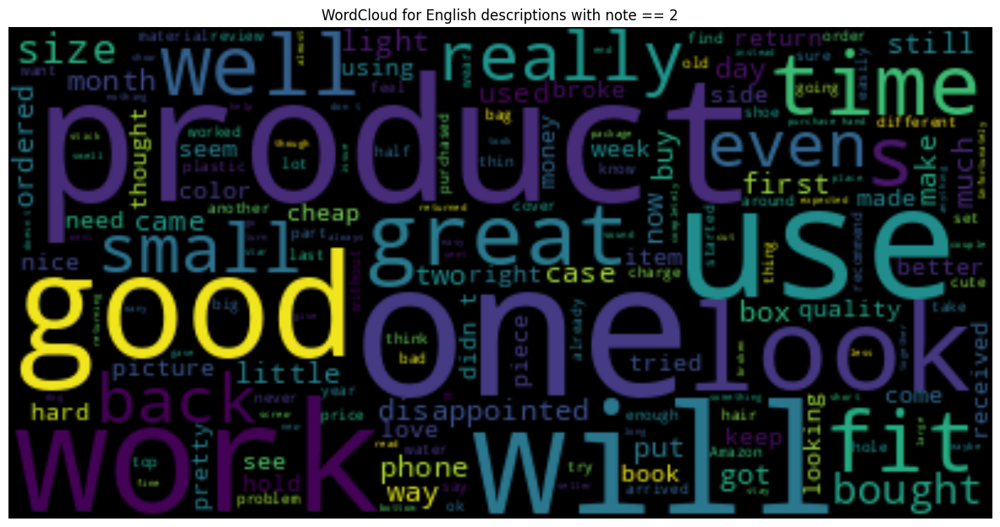

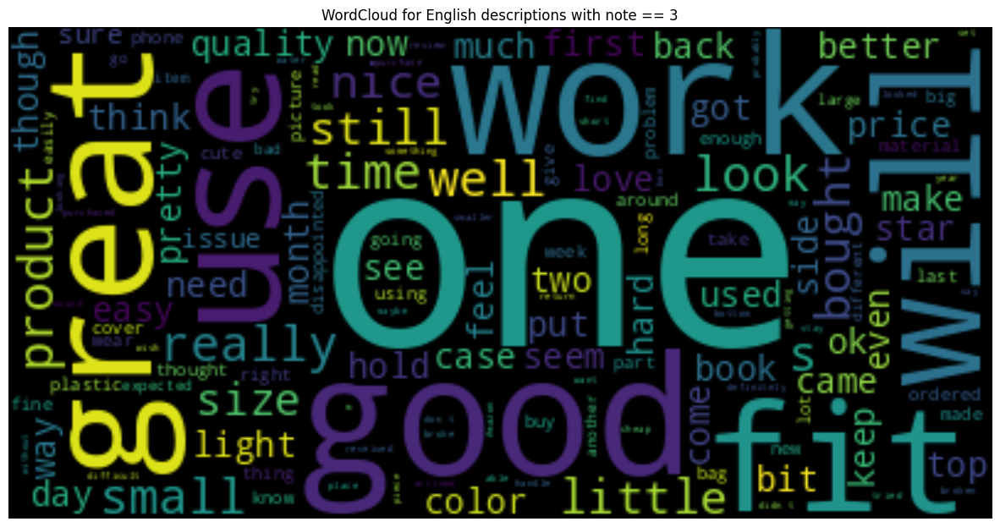

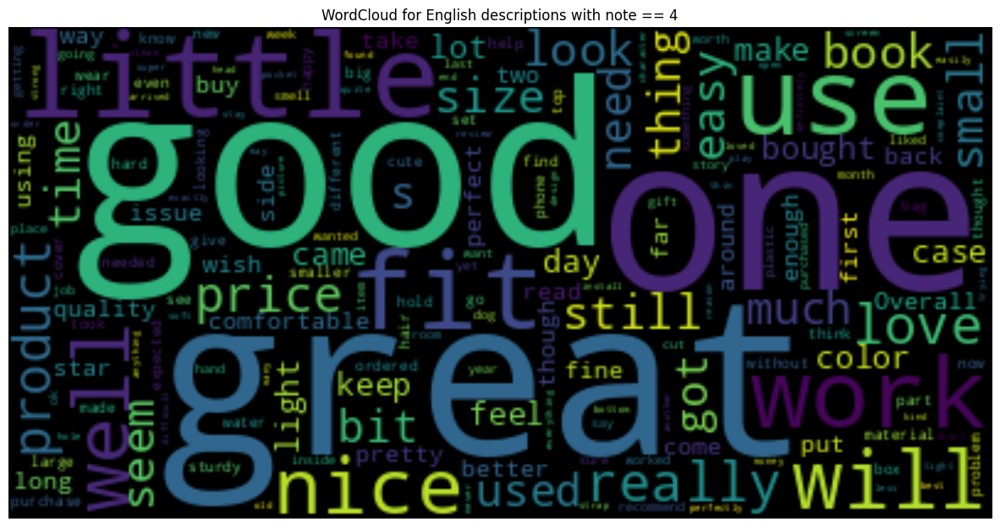

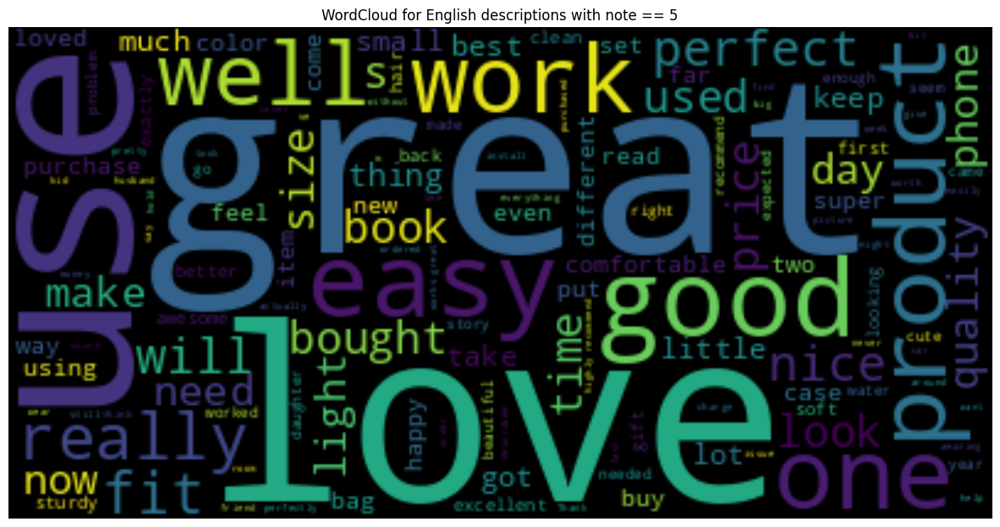

In [30]:
for i in range(1,6):
    clouden = WordCloud().generate(docens[i-1])
    plt.figure(figsize=(15,10))
    plt.imshow(clouden, interpolation='bilinear')
    plt.axis("off")
    plt.title(f'WordCloud for English descriptions with note == {i}')
    plt.show()

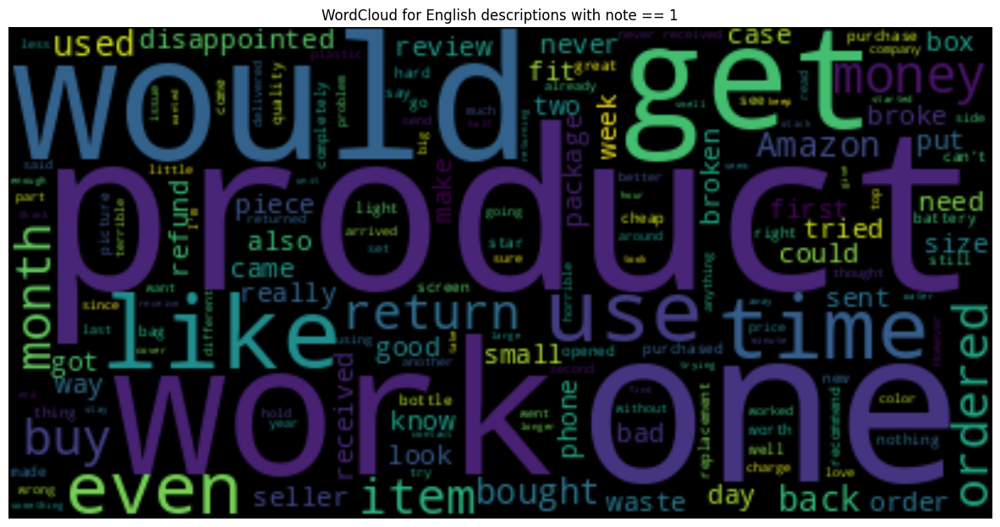

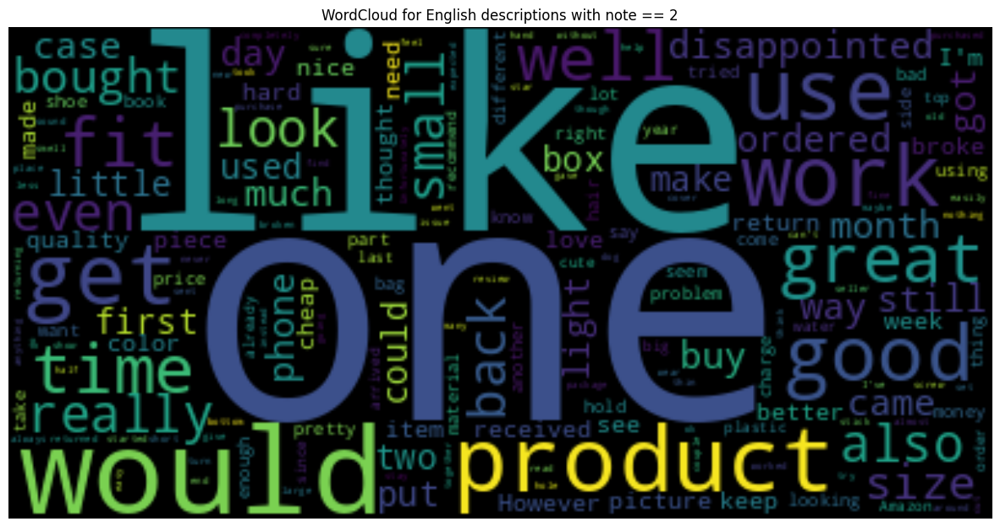

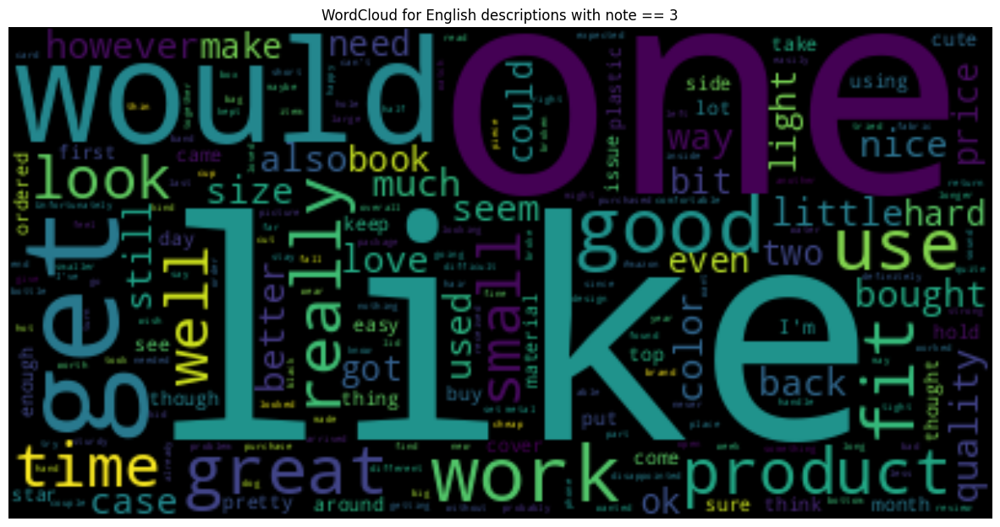

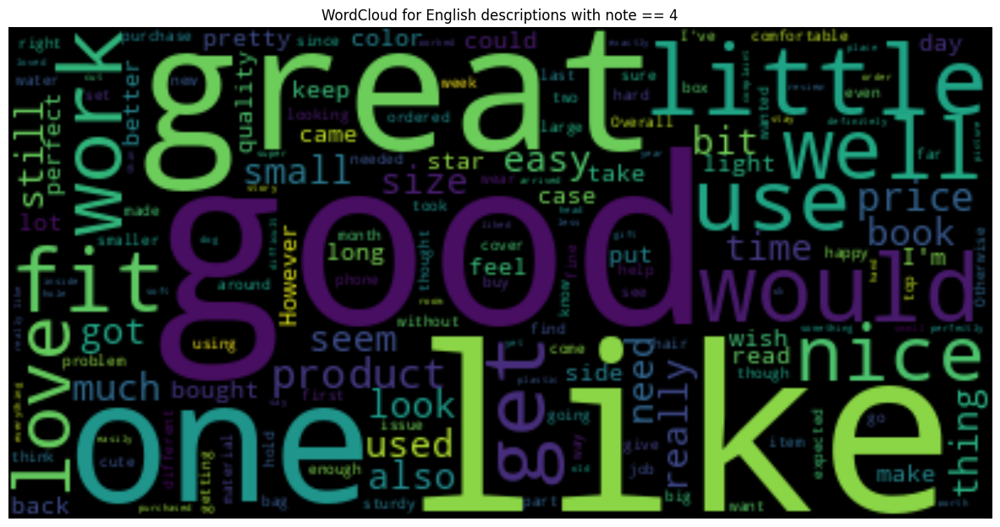

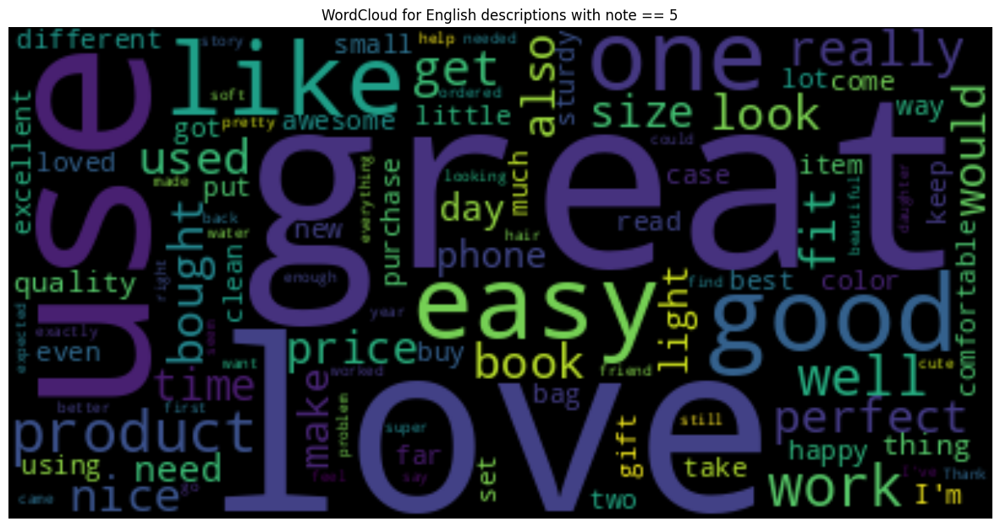

In [15]:
# Remove stopwords
stop_wordsen = set(stopwords.words('english'))
for i in range(1,6):
    clouden = WordCloud(stopwords=stop_wordsen).generate(docens[i-1])
    plt.figure(figsize=(15,10))
    plt.imshow(clouden, interpolation='bilinear')
    plt.axis("off")
    plt.title(f'WordCloud for English descriptions with note == {i}')
    plt.show()

## Merging title and body

In [31]:
def basics_preproc2(df, col):
    doc = ""
    for i, rows in df.iterrows():
        doc += rows[col[0]]
        doc += rows[col[1]]

    pattern = r"\!.?,"
    doc = re.sub(pattern, ' ', doc)
    
    bagdoc = doc.split(' ')
    bagdoc = Counter(bagdoc)
    bagdoc = dict(sorted(bagdoc.items(), key=lambda item: item[1], reverse=True))

    return doc, bagdoc

In [33]:
# Review body stars=
docfrs = []
bagdocfrs = []
frs = [fr1, fr2, fr3, fr4, fr5]
for i in range(1, 6):
    doc, bagdoc = basics_preproc2(frs[i-1], ['review_body', 'review_title'])
    docfrs.append(doc)
    bagdocfrs.append(bagdoc)

docens = []
bagdocens = []
ens = [en1, en2, en3, en4, en5]
for i in range(1, 6):
    doc, bagdoc = basics_preproc2(ens[i-1], ['review_body', 'review_title'])
    docens.append(doc)
    bagdocens.append(bagdoc)

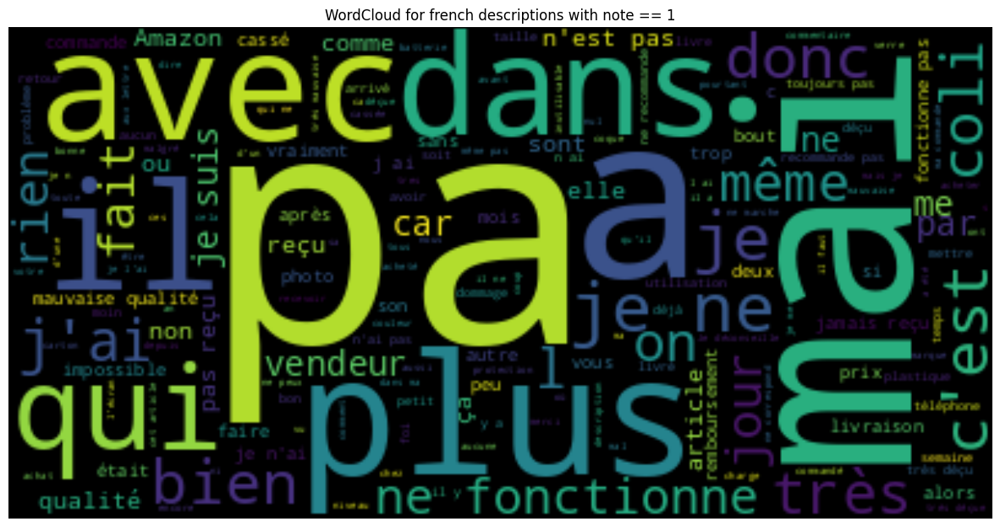

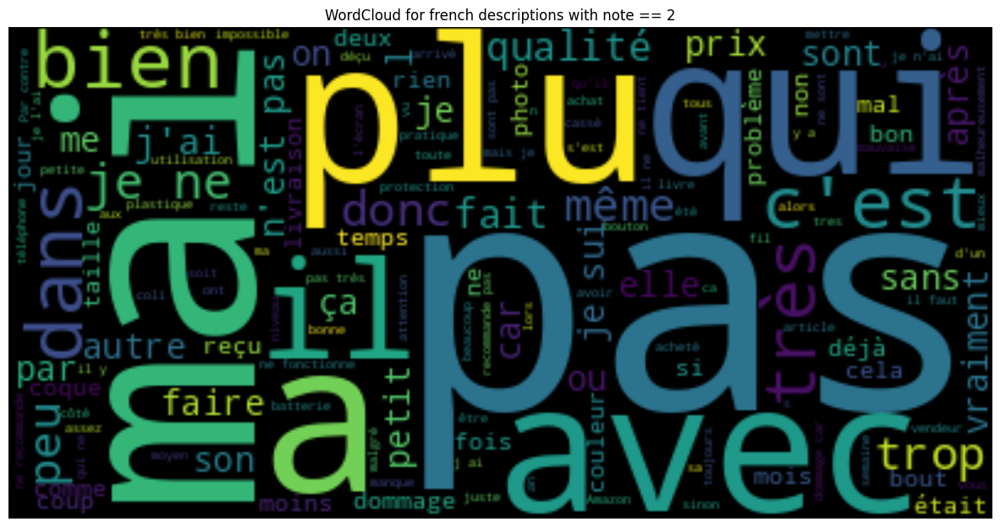

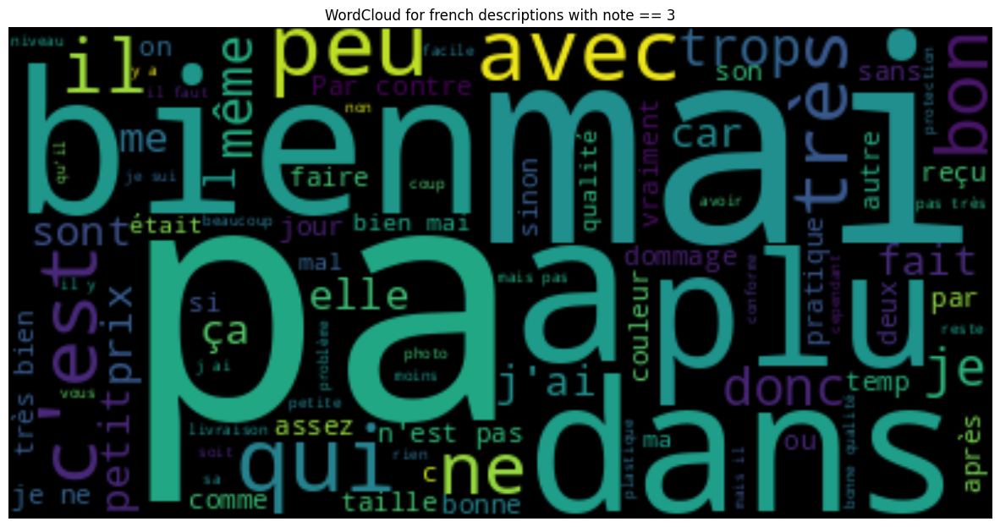

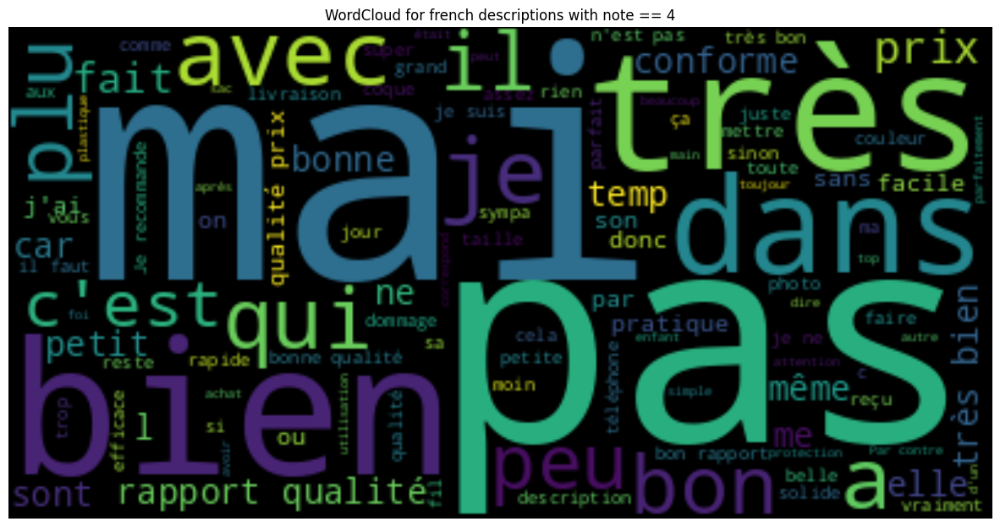

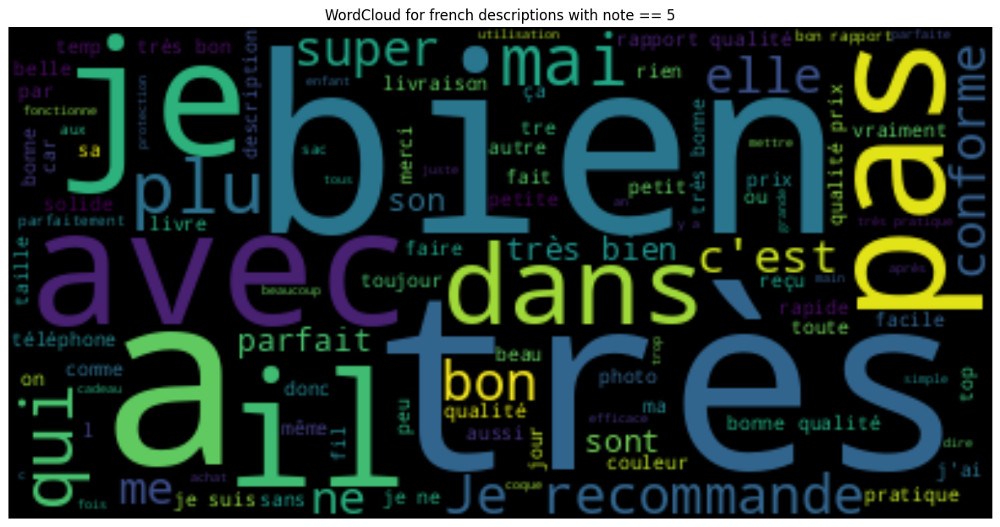

In [35]:
# stop_words = set(stopwords.words('french'))
stop_words = {"le", "de", "produit", "pour", "et", "la", "les", "sur", "à", "en", "une", "un", "est", "quand", "ce", "cette", "d", "que", "se", "au", "des", "moi", "mon", "du","tout"}
stop_words.add('produit')
stop_words.discard('a')

for i in range(1,6):
    cloudfr = WordCloud(stopwords=stop_words).generate(docfrs[i-1])
    plt.figure(figsize=(15,10))
    plt.imshow(cloudfr, interpolation='bilinear')
    plt.axis("off")
    plt.title(f'WordCloud for french descriptions with note == {i}')
    plt.show()

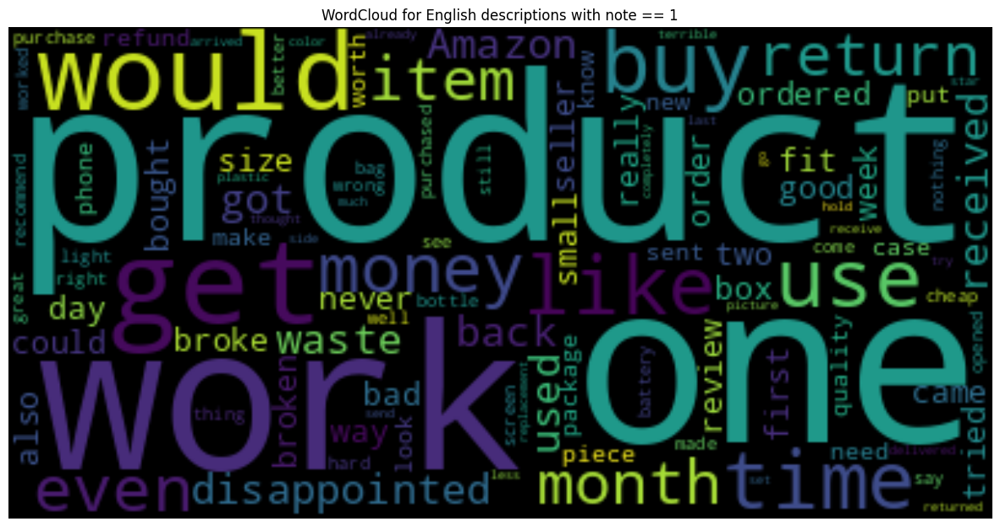

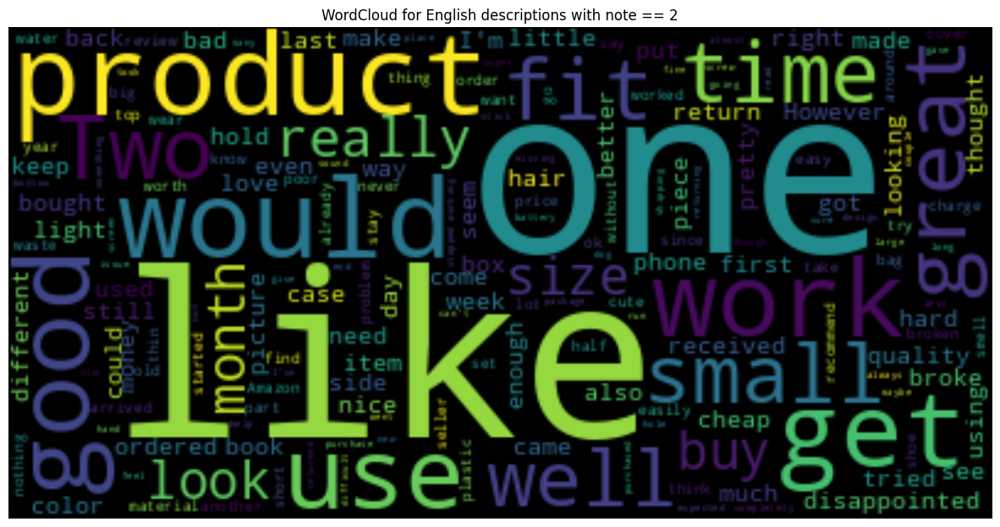

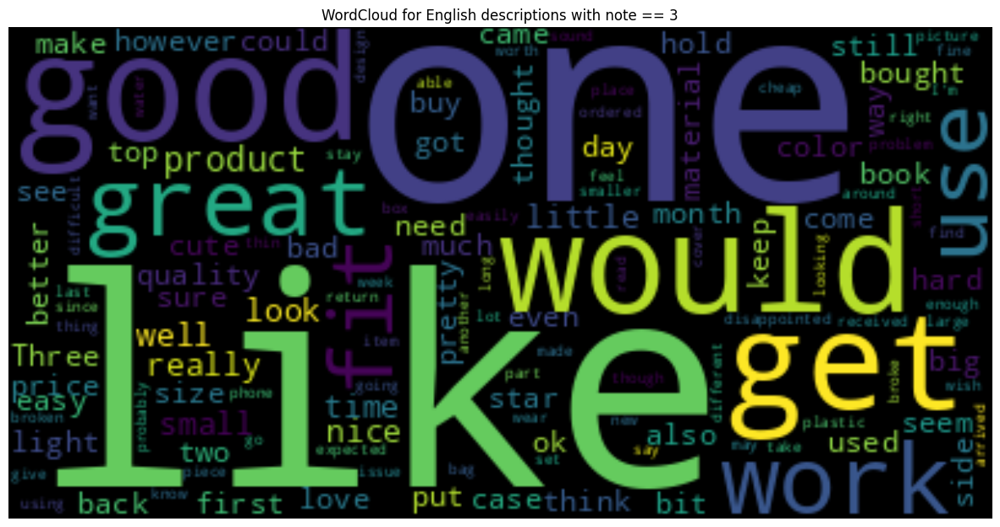

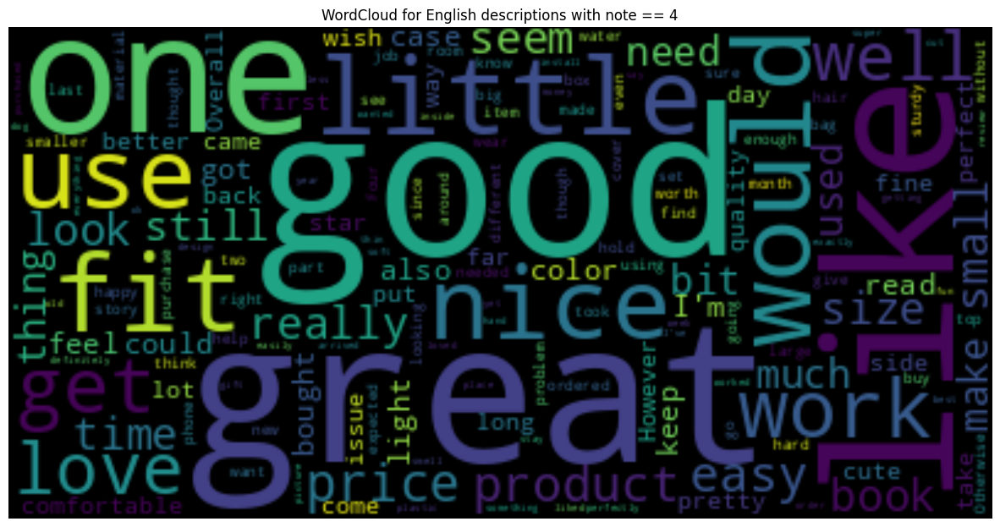

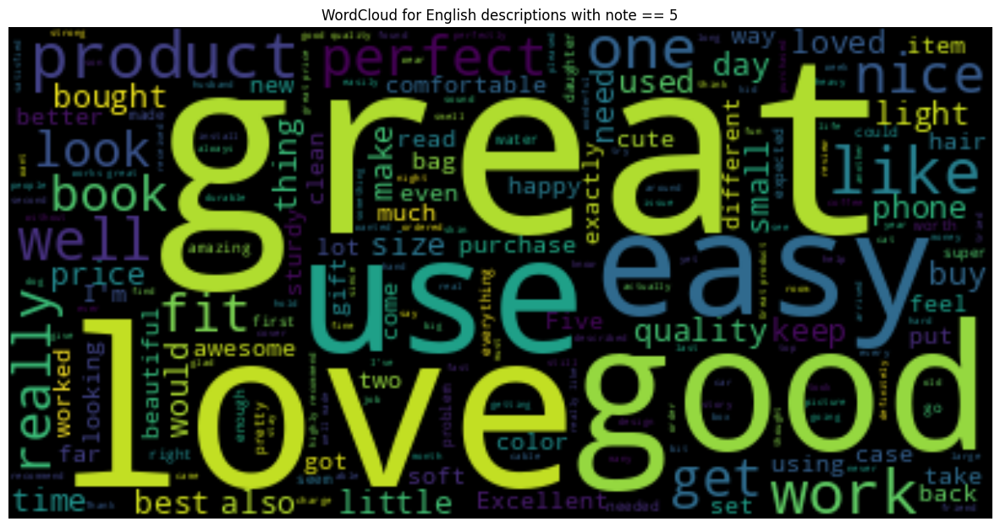

In [36]:
# Remove stopwords
stop_wordsen = set(stopwords.words('english'))
for i in range(1,6):
    clouden = WordCloud(stopwords=stop_wordsen).generate(docens[i-1])
    plt.figure(figsize=(15,10))
    plt.imshow(clouden, interpolation='bilinear')
    plt.axis("off")
    plt.title(f'WordCloud for English descriptions with note == {i}')
    plt.show()

# Conclusion

#### In French: 1;2 == Negative, 3 = Neutral, 4,5 = Positive
#### In english 1=Negtative, 2=Neutral, 3,4,5=Positive

In [37]:
def french_scores(col):
    if col == 1 or col == 2:
        result = 'non satisfied'
    elif col == 3:
        result = 'mixed'
    else:
        result = 'satisfied'

    return result

In [38]:
def english_scores(col):
    if col == 1:
        result = 'non satisfied'
    elif col == 2:
        result = 'mixed'
    else:
        result = 'satisfied'

    return result

In [39]:
fr['opinion'] = fr['stars'].apply(french_scores)

/tmp/ipykernel_6469/4063520575.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fr['opinion'] = fr['stars'].apply(french_scores)


In [40]:
en['opinion'] = en['stars'].apply(english_scores)

/tmp/ipykernel_6469/3377727376.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  en['opinion'] = en['stars'].apply(english_scores)


In [41]:
fr.head()

,stars,review_body,review_title,language,product_category,opinion
2,5,Parfait pour remplir une piñata et les sachets...,Très bon rapport qualité prix,fr,toy,satisfied
3,4,Article conforme à la description parfait pour...,Top,fr,apparel,satisfied
6,2,Ce n est pas le meilleur livre sur le sujet. P...,Pas le meilleur sur le sujet,fr,book,non satisfied
7,3,Collent bien même après plusieurs mois d’utili...,Bien mais il faudrait plus de lettres,fr,toy,mixed
8,1,Je peu rien dire car rien resus,Retro,fr,wireless,non satisfied


In [42]:
en.head()

,stars,review_body,review_title,language,product_category,opinion
0,4,"Works good, had to cut the bottom ring because...",Its nice,en,home_improvement,satisfied
1,2,As amazing as these charge very quickly. I hav...,As amazing as these charge very quickly,en,wireless,mixed
4,4,Used for decor in my wedding & really loved th...,Used for decor in my wedding & really loved th...,en,lawn_and_garden,satisfied
5,5,Happy to have less beetle problems,Bugs reduced,en,lawn_and_garden,satisfied
13,4,Lots of planning to get to lots of action,Interesting ending twist,en,digital_video_download,satisfied


In [45]:
fr['opinion'].value_counts()

opinion
satisfied        4000
non satisfied    4000
mixed            2000
Name: count, dtype: int64

In [46]:
en['opinion'].value_counts()

opinion
satisfied        6000
mixed            2000
non satisfied    2000
Name: count, dtype: int64

In [49]:
grpfr1 = fr[fr['opinion'] == 'satisfied'].sample(2000)
grpfr2 = fr[fr['opinion'] == 'non satisfied'].sample(2000)
grpfr3 = fr[fr['opinion'] == 'mixed']

grpen1 = en[en['opinion'] == 'satisfied'].sample(2000)
grpen2 = en[en['opinion'] == 'non satisfied']
grpen3 = en[en['opinion'] == 'mixed']

newdata = pd.concat([grpfr1, grpfr2, grpfr3, grpen1, grpen2, grpen3], ignore_index=True)
newdata = shuffle(newdata)

In [50]:
newdata['opinion'].value_counts()

opinion
mixed            4000
satisfied        4000
non satisfied    4000
Name: count, dtype: int64

In [51]:
newdata['language'].value_counts()

language
fr    6000
en    6000
Name: count, dtype: int64

In [52]:
newdata.to_csv('../data/cleaned/finaldataset-1.csv')

## Length of text

## Length of description

In [53]:
desc_length = []

for line in newdata.review_body:
    desc_length.append(len(line))

newdata['desc_length'] = desc_length


title_length = []

for line in newdata.review_title:
    title_length.append(len(line))

newdata['title_length'] = title_length


In [54]:
newdata.head()

,stars,review_body,review_title,language,product_category,opinion,desc_length,title_length
4458,3,Le survêtement est de bonne facture mais malhe...,Dommage,fr,apparel,mixed,173,7
1667,4,Très bon produit . Cependant j aurai aimé avoi...,Bonne qualite,fr,beauty,satisfied,127,13
1776,4,Commande arrivée en temps et en heure. Produit...,Produit conforme à la description.,fr,home_improvement,satisfied,127,34
2710,1,Très déçue même pas une semaine que mon homme ...,Mauvais article,fr,furniture,non satisfied,102,15
10955,2,The flavor was ok but I would not consider the...,B-12 Tablets,en,drugstore,mixed,407,12


### Length of body and title

array([<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>],
      dtype=object)

<Figure size 2000x1500 with 0 Axes>

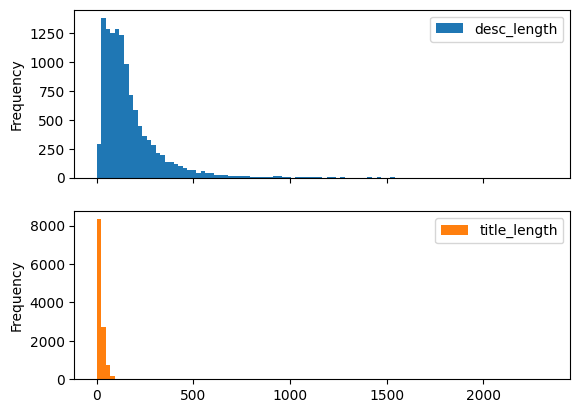

In [58]:
plt.figure(figsize=(20, 15))
newdata[['desc_length', 'title_length']].plot(kind='hist', subplots=True, bins=100)

In [59]:
newdata[['desc_length', 'title_length']].describe()

,desc_length,title_length
count,12000.000000,12000.000000
mean,169.050500,21.604750
std,155.971522,16.032824
min,15.000000,1.000000
25%,71.000000,10.000000
50%,126.000000,17.000000
75%,209.000000,28.000000
max,2333.000000,128.000000


## We retain a comined feature of the feature. Let's call it comment

In [64]:
for i, rows in newdata.iterrows():
    newdata['comments'] = rows['review_title'] + ' ' + rows['review_body']

newdata.head()

,stars,review_body,review_title,language,product_category,opinion,desc_length,title_length,comments
4458,3,Le survêtement est de bonne facture mais malhe...,Dommage,fr,apparel,mixed,173,7,but super frustrating none the less The first ...
1667,4,Très bon produit . Cependant j aurai aimé avoi...,Bonne qualite,fr,beauty,satisfied,127,13,but super frustrating none the less The first ...
1776,4,Commande arrivée en temps et en heure. Produit...,Produit conforme à la description.,fr,home_improvement,satisfied,127,34,but super frustrating none the less The first ...
2710,1,Très déçue même pas une semaine que mon homme ...,Mauvais article,fr,furniture,non satisfied,102,15,but super frustrating none the less The first ...
10955,2,The flavor was ok but I would not consider the...,B-12 Tablets,en,drugstore,mixed,407,12,but super frustrating none the less The first ...


In [65]:
newdata['comments'] = newdata['comments'].str.lower()

def remove_emoji(string):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', string)

newdata['comments'] = newdata['comments'].apply(remove_emoji)

In [72]:
map = {'non satisfied': 0, 'mixed': 1, 'satisfied': 2}

newdata['score'] = newdata['opinion'].map(lambda x: map[x])

In [73]:
newdata.head()

,stars,review_body,review_title,language,product_category,opinion,desc_length,title_length,comments,score
4458,3,Le survêtement est de bonne facture mais malhe...,Dommage,fr,apparel,mixed,173,7,but super frustrating none the less the first ...,1
1667,4,Très bon produit . Cependant j aurai aimé avoi...,Bonne qualite,fr,beauty,satisfied,127,13,but super frustrating none the less the first ...,2
1776,4,Commande arrivée en temps et en heure. Produit...,Produit conforme à la description.,fr,home_improvement,satisfied,127,34,but super frustrating none the less the first ...,2
2710,1,Très déçue même pas une semaine que mon homme ...,Mauvais article,fr,furniture,non satisfied,102,15,but super frustrating none the less the first ...,0
10955,2,The flavor was ok but I would not consider the...,B-12 Tablets,en,drugstore,mixed,407,12,but super frustrating none the less the first ...,1


In [74]:
newdata.to_csv('../data/cleaned/train.csv')

### Features : body and title

### Target : score